# Post-scVI analysis of donor P13 data: SN+multiome; all trophoblast states; cleanup v5 (getting final invading troph annotations in notebook S6-3)

After CCG and doublets removal (both by genotype and GEX)

This the version of the manifold after running scVI by `sample`

11.2021

What happens here:
- load preprocessed object (raw filtered counts)
- do normalising & log transforming
- save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- calculate neighborhood graph on the latent dimensionality reporesentation from scVI
- umap
- unbiased clustering
- save

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
import bbknn
import scrublet as scr
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

In [2]:
np.random.seed(0)

In [3]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.5
annoy               NA
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
bbknn               NA
brotli              NA
cairo               1.20.0
certifi             2021.10.08
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyte

In [4]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202007_snRNA-seq_MFI/snRNA_seq_MFI_202007_adatas/202012_FINAL_reanalysis_with_souporcell_deconvolution_common_variants/donor_P13_all_samples_analysis_202110/'

## Reading the preprocessed object

Preprocessing happened in M0 notebook

In [5]:
# reading the raw filtered object from joint analysis
adata = sc.read(save_path + 'adata_raw_filtered.h5ad')

In [6]:
adata_raw = sc.read(save_path + 'adata_raw_filtered.h5ad')

In [6]:
# reading IDs of final cells to keep after doublet exclusion (scrublet and souporcell)
nodoublet_nulcei_IDs = pd.read_csv(save_path + 'obs_table_nodoublets.csv', index_col=0)
nodoublet_nulcei_IDs

,n_genes,donor,tissue_block,age,sample,percent_mito,n_counts,dataset,technique,scrublet_score,...,barcode,souporcell_assignment,inter_ind_doublet,S_score,G2M_score,phase,annotation_prev,louvain,is_doublet_propagate,origin_M_F
barcode_sample,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGATACATG-1_WSSS_PLA8764121,1253,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000000,1820.0,snRNA-seq,10X,0.191617,...,AAACCCAAGATACATG-1_WSSS_PLA8764121,WSSS_PLA8764121_0,0,0.053412,0.056947,G2M,0_none,16,0,F
AAACCCACAAATCCCA-1_WSSS_PLA8764121,1279,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000535,1868.0,snRNA-seq,10X,0.032895,...,AAACCCACAAATCCCA-1_WSSS_PLA8764121,WSSS_PLA8764121_1,0,-0.120729,-0.113529,G1,dM2,10,0,M
AAACCCACAACTGTGT-1_WSSS_PLA8764121,473,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000000,556.0,snRNA-seq,10X,0.091892,...,AAACCCACAACTGTGT-1_WSSS_PLA8764121,WSSS_PLA8764121_1,0,0.042173,-0.027934,S,0_none,14,0,M
AAACCCACAAGCTGCC-1_WSSS_PLA8764121,1360,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000473,2116.0,snRNA-seq,10X,0.012335,...,AAACCCACAAGCTGCC-1_WSSS_PLA8764121,WSSS_PLA8764121_1,0,-0.121624,0.050396,G2M,dNK1,14,0,M
AAACCCACATAACCCA-1_WSSS_PLA8764121,1891,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000305,3274.0,snRNA-seq,10X,0.073634,...,AAACCCACATAACCCA-1_WSSS_PLA8764121,WSSS_PLA8764121_1,0,-0.125064,-0.066023,G1,dS1,8,0,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTGTTCGTCAAGT-1_Pla_Camb10714920_and_40110_Pla_Camb10687916,2409,P13,unknown,8-9_PCW,Pla_Camb10714920_and_40110_Pla_Camb10687916,0.007270,5227.0,snRNA-seq,10X,0.013699,...,TTTGTGTTCGTCAAGT-1_Pla_Camb10714920_and_40110_...,Pla_Camb10714920_and_40110_Pla_Camb10687916_0,0,0.033632,-0.079893,S,0_none,7,0,M
TTTGTGTTCTTAGTCT-1_Pla_Camb10714920_and_40110_Pla_Camb10687916,4129,P13,unknown,8-9_PCW,Pla_Camb10714920_and_40110_Pla_Camb10687916,0.002532,17379.0,snRNA-seq,10X,0.102190,...,TTTGTGTTCTTAGTCT-1_Pla_Camb10714920_and_40110_...,Pla_Camb10714920_and_40110_Pla_Camb10687916_1,0,-0.059688,-0.098701,G1,0_none,2,0,F
TTTGTTGGTCACAGCG-1_Pla_Camb10714920_and_40110_Pla_Camb10687916,3116,P13,unknown,8-9_PCW,Pla_Camb10714920_and_40110_Pla_Camb10687916,0.004499,7779.0,snRNA-seq,10X,0.036876,...,TTTGTTGGTCACAGCG-1_Pla_Camb10714920_and_40110_...,Pla_Camb10714920_and_40110_Pla_Camb10687916_1,0,0.066281,-0.038885,S,0_none,30,0,F


In [7]:
# subsetting the adata object to final cells
adata = adata[list(nodoublet_nulcei_IDs.index), :].copy()
adata

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


AnnData object with n_obs × n_vars = 74244 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'

In [8]:
np.unique(adata.obs['sample'])

array(['Pla_Camb10691970', 'Pla_Camb10691971',
       'Pla_Camb10714919_and_40110_Pla_Camb10687915',
       'Pla_Camb10714920_and_40110_Pla_Camb10687916', 'WSSS_PLA8764121',
       'WSSS_PLA8764122', 'WSSS_PLA8810750', 'WSSS_PLA8810751'],
      dtype=object)

In [9]:
# adding metadata
for col in nodoublet_nulcei_IDs.columns:
    print(col)
    adata.obs[col] = nodoublet_nulcei_IDs.loc[adata.obs_names,col]

n_genes
donor
tissue_block
age
sample
percent_mito
n_counts
dataset
technique
scrublet_score
scrublet_cluster_score
bh_pval
batch
is_doublet
barcode_sample_copy
barcode
souporcell_assignment
inter_ind_doublet
S_score
G2M_score
phase
annotation_prev
louvain
is_doublet_propagate
origin_M_F


In [10]:
np.unique(adata.obs['sample'])

array(['Pla_Camb10691970', 'Pla_Camb10691971',
       'Pla_Camb10714919_and_40110_Pla_Camb10687915',
       'Pla_Camb10714920_and_40110_Pla_Camb10687916', 'WSSS_PLA8764121',
       'WSSS_PLA8764122', 'WSSS_PLA8810750', 'WSSS_PLA8810751'],
      dtype=object)

In [11]:
adata.obs['annotation_prev_or_removed'] = adata.obs['annotation_prev']

adata.obs['annotation_prev_or_removed'] = ['removed' if (value == '0_none' and sample in ['WSSS_PLA8764121',
       'WSSS_PLA8764122', 'WSSS_PLA8810750', 'WSSS_PLA8810751']) else value for value,sample in zip(adata.obs['annotation_prev'], adata.obs['sample'])]

In [12]:
np.unique(adata.obs['annotation_prev_or_removed'])

array(['0_none', 'DC1', 'EVT_1', 'EVT_2', 'EVT_3', 'Endo_F', 'Endo_L',
       'Endo_M', 'GC', 'HOFB', 'SCT', 'VCT', 'VCT_CCC', 'VCT_fusing',
       'VCT_p', 'dEpi_secretory', 'dM2', 'dNK1', 'dNK3', 'dPV1', 'dS1',
       'dS3', 'eEVT', 'fF', 'fPV', 'iEVT', 'removed', 'uSMC'],
      dtype=object)

In [13]:
# quick check to see if raw is raw or not
expr_mtx_dense = adata[adata.obs['sample'] == 'Pla_Camb10691970'].X.todense()

In [14]:
# YAS we all good
np.unique(expr_mtx_dense)

matrix([[   0.,    0.,    0., ..., 4162., 4637., 6366.]], dtype=float32)

In [15]:
# also subsetting to only trophoblast after cleanup v3 in S3-3 notebook
labels = pd.read_csv(save_path + 'obs_table_adata_scvi_SN_and_multiome_with_trophoblast_contaminant_v3_labels.csv', index_col=0)
troph_idx = labels[labels['cleanup_v3_contaminant'] == 'keeping'].index
adata = adata[troph_idx,:].copy()
adata

AnnData object with n_obs × n_vars = 39298 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'

In [40]:
# AND labelling inv troph to then get rid of those that did not make it according to notebook S4-3
inv_troph_labels_initial = pd.read_csv(save_path + 'obs_table_adata_scvi_SN_and_multiome_with_inv_troph_labels_S3-4_notebook.csv', index_col=0)

adata.obs['inv_troph_labels_initial'] = inv_troph_labels_initial.loc[list(set(adata.obs_names) & set(inv_troph_labels_initial.index)), 'inv_troph_labels']

# indices of final cleaned up invading trophoblast
inv_troph_final_labels = pd.read_csv(save_path + 'annotations_SN_and_multiome_inv_troph_cleanup_v2_final_20211110.csv', index_col=0).index

idx_inv_troph_initial = list(adata[adata.obs['inv_troph_labels_initial'] == 'inv_troph'].obs_names)

idx_to_exclude = list(set(idx_inv_troph_initial) - set(inv_troph_final_labels))

# indices of nuclei that were labelled as invading troph in notebook S3-4 and made it to the end of notebook S4-3 (i e didn't get filtered out as contaminants)
idx_to_keep = list(set(adata.obs_names) - set(idx_to_exclude))


/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [41]:
len(idx_to_keep)

37675

In [42]:
adata

AnnData object with n_obs × n_vars = 39298 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'

In [43]:
adata = adata[idx_to_keep,:].copy()

In [44]:
adata

AnnData object with n_obs × n_vars = 37675 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'

# Preparation for scVI: 

1) Calculating cell cycle-associated genes (to later be excluded in scVI analysis)
2) Calculating a minimum extimate of number of latent variables to use in scVI analysis later (when doing batch correction) as the number of PCs optimally explaining this data

for a suset of data corresponding to only invading trophoblast (according to selection done above)

Let's see if cell cycle has an effect in trophoblast and remember them to exclude in scVI calculation

In [48]:
adata_copy = adata.copy()

In [49]:
adata_copy

AnnData object with n_obs × n_vars = 37675 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p'

In [50]:
# normalise and log transform
sc.pp.normalize_per_cell(adata_copy, counts_per_cell_after=1e4)
sc.pp.log1p(adata_copy)

# saving the raw attribute
adata_copy.raw = adata_copy.copy()

adata_copy.var_names_make_unique()
adata_copy.obs_names_make_unique()

normalizing by total count per cell
/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


### Filter Cell cycle genes

### SN + multiome, invading trophoblast states manifold, cleanup v1

Per genes analysis: identify genes behaving like known cell cycle genes


In [51]:
cellcycle_adata = adata_copy.copy()
# Extract highly variable genes
#filter_result = sc.pp.filter_genes_dispersion(
#    cellcycle_adata.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
#sc.pl.filter_genes_dispersion(filter_result,save='_ccg_identification.pdf')

In [52]:
# Traspose matrix for a GENE-centered analysis
cellcycle_adata = cellcycle_adata.T
#cellcycle_adata = cellcycle_adata[filter_result.gene_subset,:]


In [53]:
# Scale data to unit variance and zero mean
sc.pp.scale(cellcycle_adata, max_value=10)
# Scatter plot in PCA coordinates
sc.tl.pca(cellcycle_adata)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:01:07)


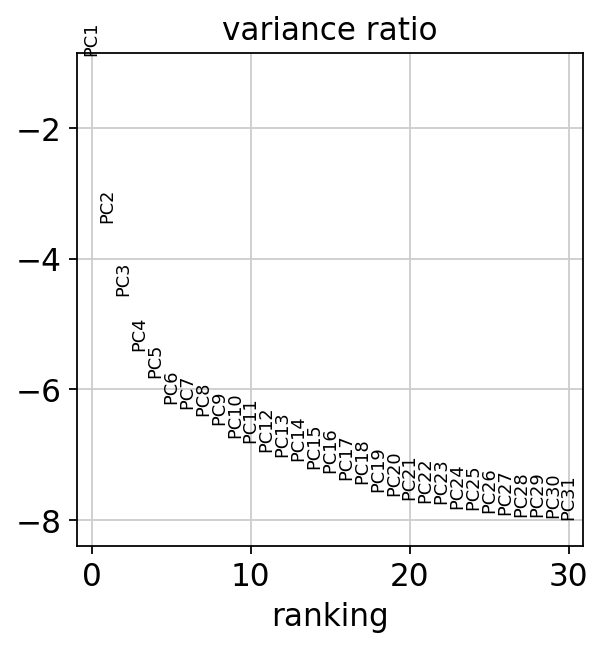

In [54]:
# Plot the variance ratio
sc.pl.pca_variance_ratio(cellcycle_adata, log=True, save='_ccg_identification.pdf')

computing neighbors
    using 'X_pca' with n_pcs = 6
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
... storing 'donor' as categorical
... storing 'tissue_block' as categorical
... storing 'age' as categorical
... storing 'sample' as categorical
... storing 'dataset' as categorical
... storing 'technique' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'phase' as categorical
... storing 'annotation_prev' as categorical
... storing 'origin_M_F' as categorical
... storing 'annotation_prev_or_removed' as categorical
... storing 'inv_troph_labels_initial' as categorical


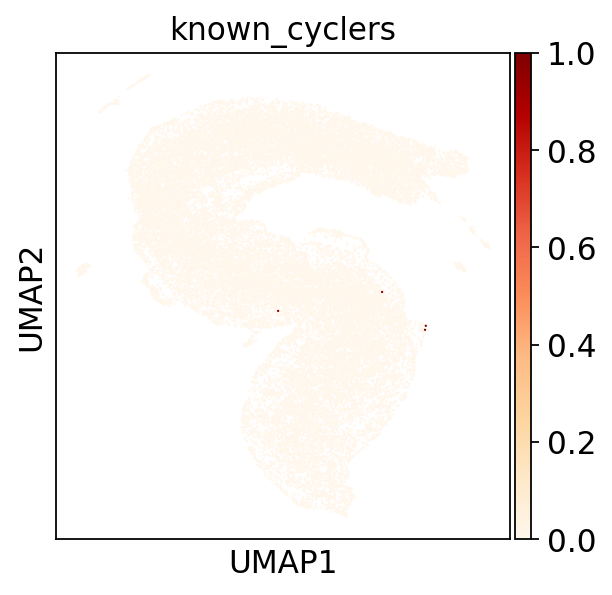

In [55]:
# Identify genes behaving like cc genes
num_pcs = 6
# Compute a neighborhood graph of observations
sc.pp.neighbors(cellcycle_adata,n_pcs=num_pcs)
# Embed the neighborhood graph using UMAP
sc.tl.umap(cellcycle_adata)
cellcycle_adata.obs['known_cyclers'] = [1 if gene in ['CDK1','MKI67','CCNB2','PCNA'] else 0 for gene in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers'],color_map='OrRd',save='_ccg_identification.pdf')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 28 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:02)


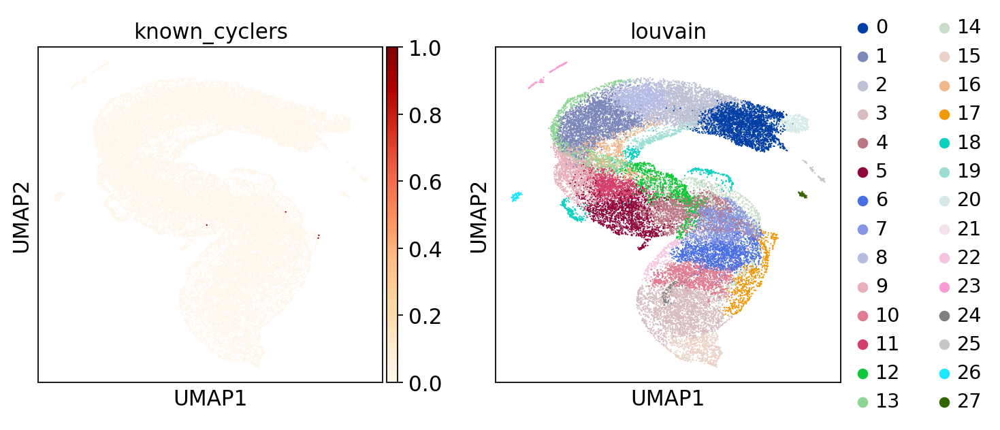

In [56]:
# Cluster GENES into subgroups using louvain
sc.tl.louvain(cellcycle_adata, resolution=1.0)
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers',
                                  'louvain'],color_map='OrRd',save='_ccg_identification.pdf')

In [57]:
# Locate genes of interests' cluster
print(cellcycle_adata.obs.loc[['CDK1','MKI67','CCNB2','PCNA'],'louvain'])


CDK1     17
MKI67    17
CCNB2     5
PCNA      7
Name: louvain, dtype: category
Categories (28, object): ['0', '1', '2', '3', ..., '24', '25', '26', '27']


In [58]:
adata_copy

AnnData object with n_obs × n_vars = 37675 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p'

So removing genes from cluster 17 by filtering the main matrix

In [59]:
# Add unstructured dict-like annotation for ccgs
adata_copy.uns['ccgs'] = list(cellcycle_adata.obs[(cellcycle_adata.obs['louvain']=='17')].index)
# Remove cc genes
adata_copy = adata_copy[:,[i not in adata_copy.uns['ccgs'] for i in adata_copy.var_names]]


/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [60]:
adata_copy

View of AnnData object with n_obs × n_vars = 37675 × 28465
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'ccgs'

In [61]:
# Assign cell cycle stage & scores
cell_cycle_genes = [x.strip() for x in open(file='/home/jovyan/notebooks/Vento_Lab/regev_lab_cell_cycle_genes_from_Luz_20200505.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata_copy.var_names]
g2m_genes = [x for x in g2m_genes if x in adata_copy.var_names]
sc.tl.score_genes_cell_cycle(adata_copy, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
Trying to set attribute `.obs` of view, copying.
    finished: added
    'S_score', score of gene set (adata.obs).
    307 total control genes are used. (0:00:04)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    307 total control genes are used. (0:00:02)
-->     'phase', cell cycle phase (adata.obs)


In [62]:
adata_copy

AnnData object with n_obs × n_vars = 37675 × 28465
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'ccgs'

In [63]:
# save for scVI
adata_copy.var.to_csv(save_path + 'genes_without_CC_assoc_genes_for_scVI_SN_and_multiome_all_trophoblast_cleanup_v5_final_20211110.csv')

In [65]:
# also saving this obs table to subset in scVI easier
adata_copy.obs.to_csv(save_path + 'obs_table_for_scVI_SN_and_multiome_all_trophoblast_cleanup_v5_final_20211110.csv')

# to recalc scVI with informed n_latent, let's see how many PCs explain the trophoblast data


extracting highly variable genes
    finished (0:00:09)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


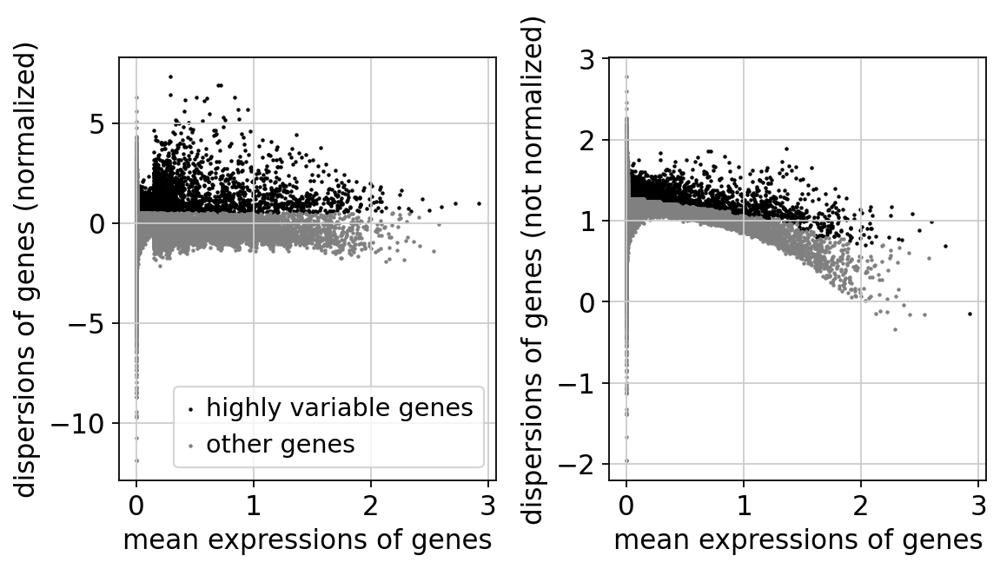

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:25)


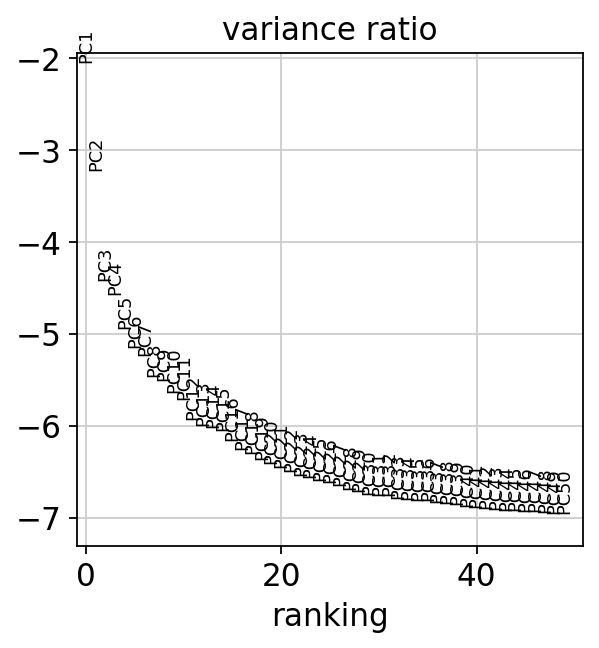

In [64]:
sc.pp.highly_variable_genes(adata_copy, min_mean=0.0125, max_mean=3, min_disp=0.5)

sc.pl.highly_variable_genes(adata_copy)

adata_copy_hvg = adata_copy[:, adata_copy.var['highly_variable']]

sc.tl.pca(adata_copy_hvg, svd_solver='arpack',
         n_comps=50)

sc.pl.pca_variance_ratio(adata_copy_hvg, log=True, save=False,
                        n_pcs=50)

In [66]:
# using n_latent = 8; 12 and 17

From here following to run scVI on this cleaned up invading troph subset + rest of trophoblast in: `/nfs/team292/aa22/scVI_related/202111_upd_in_vivo_analysis/donor_P13_analysis/scVI_integration_SN_and_multiome_trophoblast.ipynb`

________

Carrying on to 
- Normalise and log transform
- Save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- Make cell names (obs) and gene names (var) unique

In [67]:
# normalise and log transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

# saving normalised and log transformed values into the raw attribute to later be able to plot
adata.raw = adata.copy()

adata.var_names_make_unique()
adata.obs_names_make_unique()

normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


_____________________________________________________________________________________________________________________________________________________________

In [68]:
# Assign cell cycle stage & scores
cell_cycle_genes = [x.strip() for x in open(file='/home/jovyan/notebooks/Vento_Lab/regev_lab_cell_cycle_genes_from_Luz_20200505.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    503 total control genes are used. (0:00:01)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    419 total control genes are used. (0:00:01)
-->     'phase', cell cycle phase (adata.obs)


In [69]:
adata

AnnData object with n_obs × n_vars = 37675 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p'

_______________________________________________________________________________________________________

# Read in scVI-calculated latent representation

In [70]:
# a few values
n_latent = [8,12,17
           ]

### 10.11.2021 run, correction by `sample`

In [74]:
latent_representations_donor = {}

# didn't align as well as corrected by donor_sample

for n_latent_value in n_latent:
    print(n_latent_value)
    
    curr_path = '/nfs/team292/aa22/scVI_related/202111_upd_in_vivo_analysis/results/20211110_obsm_with_scVI_latent_representation_n_' + str(n_latent_value) + '_after_CCG_removal_and_all_doublet_exclusion_by_sample_donor_P13_SN_and_multiome_all_trophoblast_cleanup_v5_final.csv' 
        
    latent_representations_donor[n_latent_value] = pd.read_csv(curr_path, index_col=0)

8
12
17


In [75]:
# assign these latent_representations into adata.obsm
for n_latent_value in n_latent:
    print(n_latent_value)
    adata.obsm['X_scVI_n_latent_' + str(n_latent_value) + '_sample'] = np.array(latent_representations_donor[n_latent_value])

8
12
17


In [76]:
adata.obsm['X_scVI_n_latent_8_sample'].shape

(37675, 8)

__________________________________________________________________________________________________________________________________________________________________

### Neighbourhood graph & UMAP

In [77]:
%%time

for n_latent_value in n_latent:
    print(n_latent_value)
    sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_scVI_n_latent_' + str(n_latent_value) + '_sample',
               key_added='neighbors_scVI_n_latent_' + str(n_latent_value) + '_sample' )

computing neighbors


8


    finished: added to `.uns['neighbors_scVI_n_latent_8_sample']`
    `.obsp['neighbors_scVI_n_latent_8_sample_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_scVI_n_latent_8_sample_connectivities']`, weighted adjacency matrix (0:00:02)
computing neighbors


12


    finished: added to `.uns['neighbors_scVI_n_latent_12_sample']`
    `.obsp['neighbors_scVI_n_latent_12_sample_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_scVI_n_latent_12_sample_connectivities']`, weighted adjacency matrix (0:00:03)
computing neighbors


17


    finished: added to `.uns['neighbors_scVI_n_latent_17_sample']`
    `.obsp['neighbors_scVI_n_latent_17_sample_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_scVI_n_latent_17_sample_connectivities']`, weighted adjacency matrix (0:00:03)


CPU times: user 18.3 s, sys: 34.6 s, total: 52.9 s
Wall time: 8.82 s


In [78]:
adata

AnnData object with n_obs × n_vars = 37675 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'neighbors_scVI_n_latent_8_sa

__________________________________________________________________________________________________________________________________________________________________

In [79]:
%%time

for n_latent_value in n_latent:
    print(n_latent_value)

    sc.tl.umap(adata, random_state=0,
              neighbors_key='neighbors_scVI_n_latent_' + str(n_latent_value) + '_sample')
    # copy current adata.obsm['X_umap'] into adata.obsm['X_umap_scVI_n_latent_' + str(n_latent_value)]
    adata.obsm['X_umap_scVI_n_latent_' + str(n_latent_value) + '_sample'] = adata.obsm['X_umap']
    
    

computing UMAP


8


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
computing UMAP


12


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
computing UMAP


17


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)


CPU times: user 1min, sys: 25.5 s, total: 1min 25s
Wall time: 38.4 s


In [80]:
np.unique(adata.obs['sample'], return_counts=True)

(array(['Pla_Camb10691970', 'Pla_Camb10691971',
        'Pla_Camb10714919_and_40110_Pla_Camb10687915',
        'Pla_Camb10714920_and_40110_Pla_Camb10687916', 'WSSS_PLA8764121',
        'WSSS_PLA8764122', 'WSSS_PLA8810750', 'WSSS_PLA8810751'],
       dtype=object),
 array([3942, 3742, 3075, 3103, 3165, 3145, 9337, 8166]))

In [81]:
adata

AnnData object with n_obs × n_vars = 37675 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'neighbors_scVI_n_latent_8_sa

## Saving this object with all the manifolds calculated

In [82]:
adata.write(save_path + 'adata_P13_scVI_analysed_corr_by_sample_SN_and_multiome_trophoblast_v5_final.h5ad')


... storing 'donor' as categorical
... storing 'tissue_block' as categorical
... storing 'age' as categorical
... storing 'sample' as categorical
... storing 'dataset' as categorical
... storing 'technique' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'phase' as categorical
... storing 'annotation_prev' as categorical
... storing 'origin_M_F' as categorical
... storing 'annotation_prev_or_removed' as categorical
... storing 'inv_troph_labels_initial' as categorical


In [5]:
# reading the previously saved file
adata = sc.read(save_path + 'adata_P13_scVI_analysed_corr_by_sample_SN_and_multiome_trophoblast_v5_final.h5ad')


In [83]:
palette_new = ['lightgrey', # none / new samples data
               '#d5e7f7',
                 '#d895ea',
                 '#9f6bac',
                 '#bf4cea',
                 '#b9a96b',
                 '#f8f4a8',
                 '#eacf68',
                 '#DBC7DE',
                 '#69b4ce',
                 '#eb5376',
                 '#ecdbe5',
                 '#e7a3c8',
                 '#b53279',
                 '#e96db3',
                 '#c35338',
                 '#66cef6',
                 '#deeab1',
                 '#2d563c',
                 '#6b6a6b',
                 '#c9bdb2',
                 '#eaa944',
                 '#FF1200',
                 '#a79388',
                 '#aeb1b7',
                 '#510058',
               'blue', # previously removed as soupy nuclei
                 '#f37a73']


### scVI-corrected by `sample`

n_latent = 8

In [84]:
curr_embedding_key = 'X_umap_scVI_n_latent_8_sample'

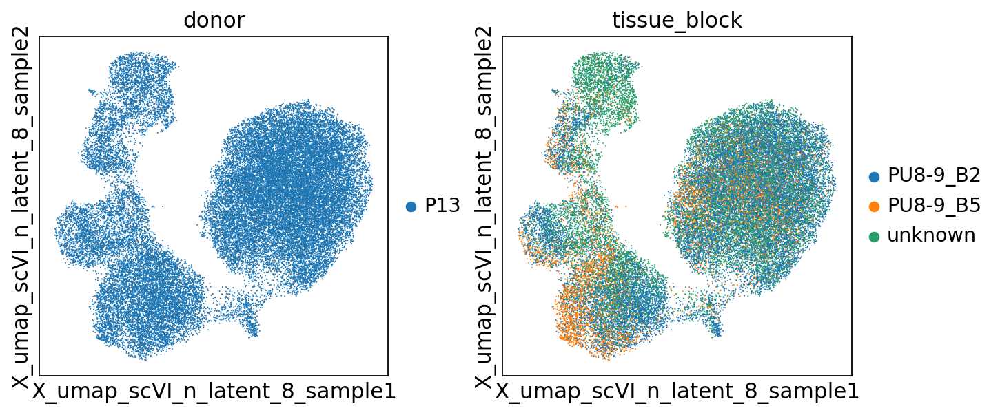

In [85]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['donor','tissue_block'])

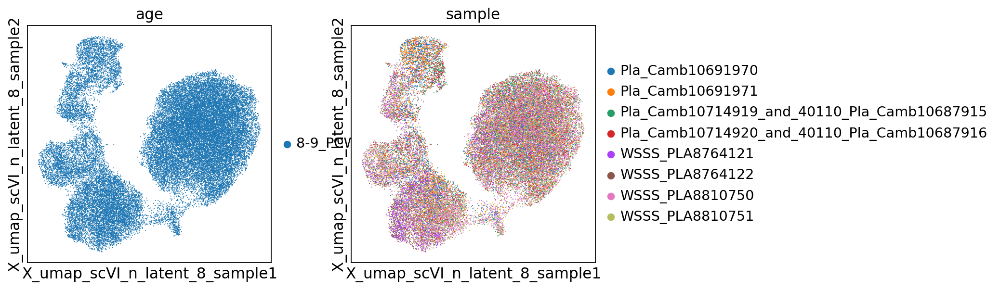

In [86]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['age','sample'])

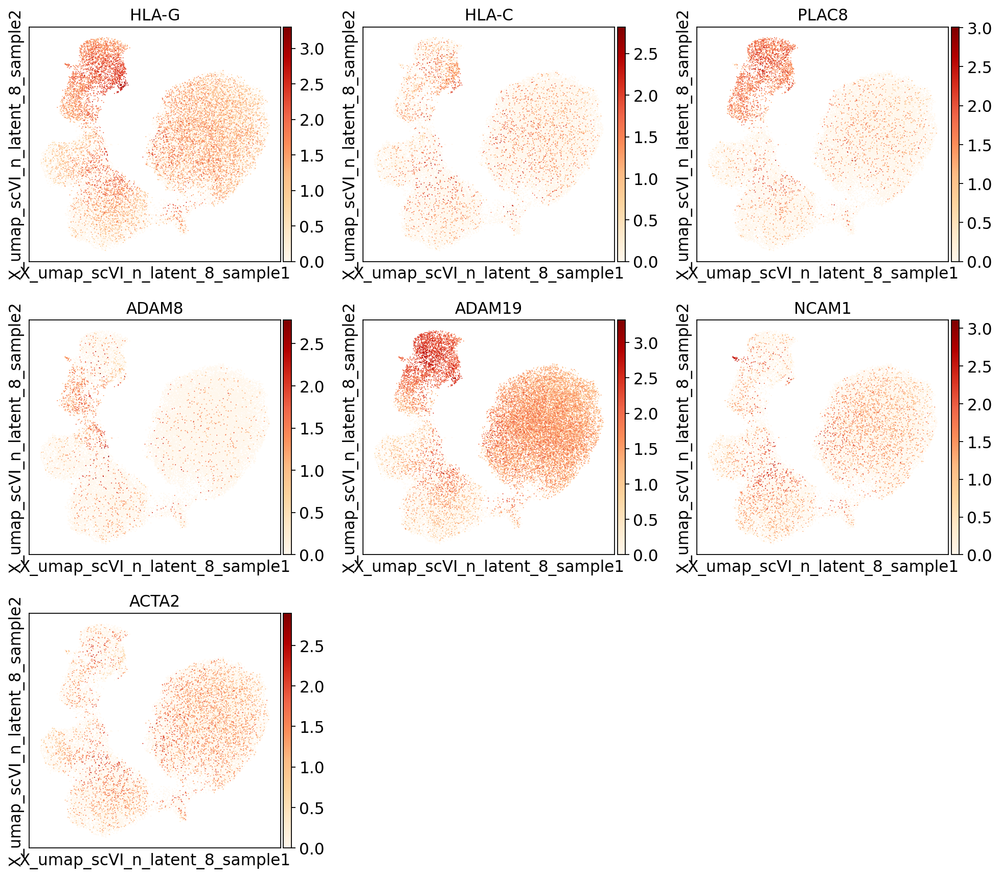

In [87]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['HLA-G','HLA-C','PLAC8',
                             'ADAM8','ADAM19',
                            'NCAM1','ACTA2'], ncols=3, use_raw=True, cmap='OrRd')

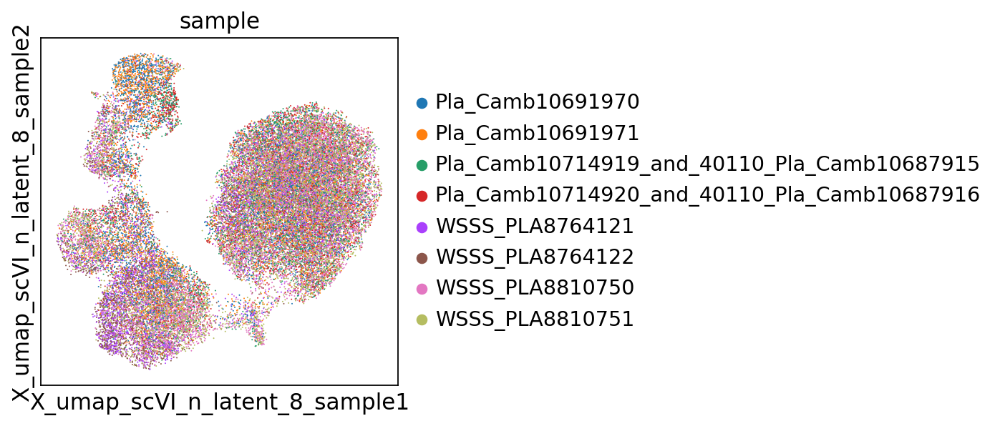

In [88]:
sc.pl.embedding(adata, curr_embedding_key, color=['sample'])

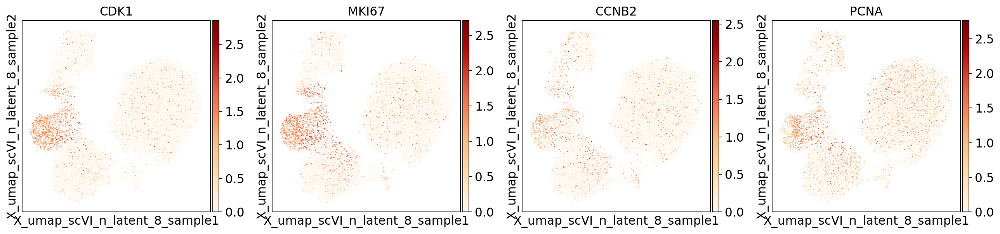

In [89]:
sc.pl.embedding(adata, curr_embedding_key, color=['CDK1','MKI67','CCNB2','PCNA'], cmap='OrRd')

In [90]:
adata

AnnData object with n_obs × n_vars = 37675 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'neighbors_scVI_n_latent_8_sa

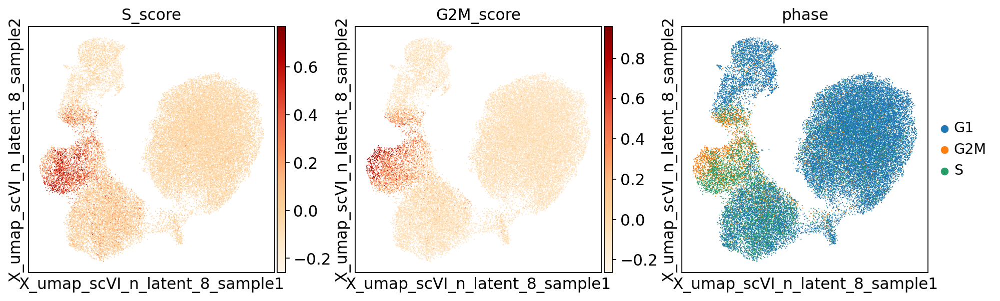

In [91]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['S_score','G2M_score','phase'], cmap='OrRd')

In [92]:
adata

AnnData object with n_obs × n_vars = 37675 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'neighbors_scVI_n_latent_8_sa

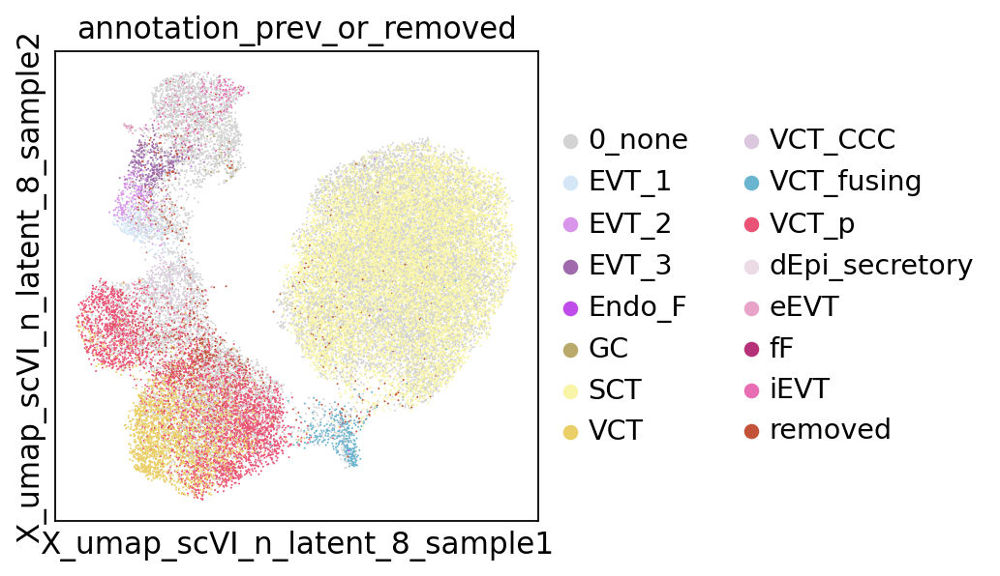

In [93]:
sc.pl.embedding(adata, curr_embedding_key, color=['annotation_prev_or_removed'], palette=palette_new)

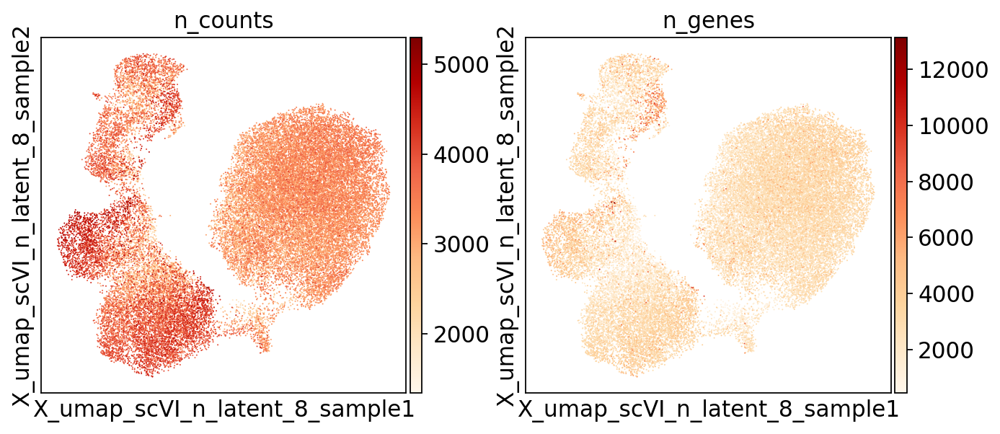

In [94]:
sc.pl.embedding(adata, curr_embedding_key, color=['n_counts',
                             'n_genes'], cmap='OrRd')

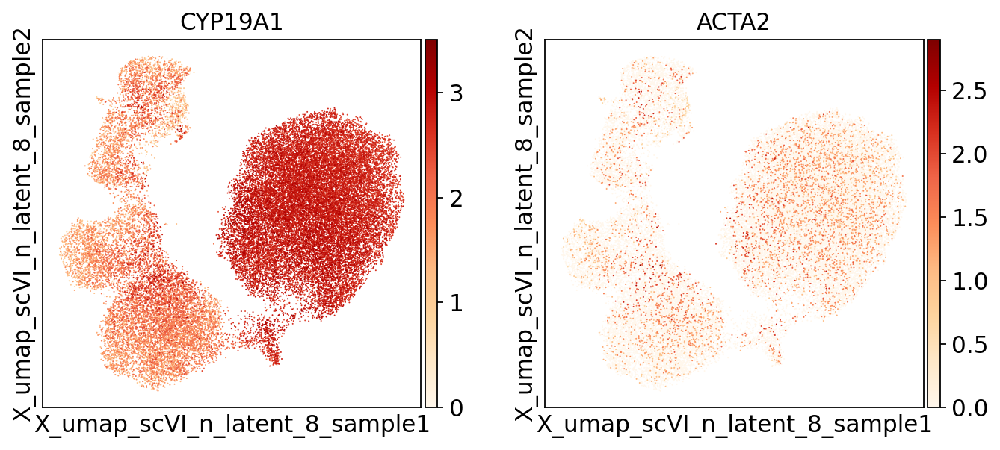

In [95]:
sc.pl.embedding(adata, curr_embedding_key, color=['CYP19A1','ACTA2'], cmap='OrRd', use_raw=True)

# using object with 8 latent variables here


In [10]:
# using object with 8 latent variables here
curr_embedding_key = 'X_umap_scVI_n_latent_8_sample'

In [121]:
# cluster apart invading troph from VCT_CCC onwards
sc.tl.louvain(adata, resolution=1.0,
             neighbors_key = 'neighbors_scVI_n_latent_8_sample',
             key_added = 'louvain_scvi_n_latent_8')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 17 clusters and added
    'louvain_scvi_n_latent_8', the cluster labels (adata.obs, categorical) (0:00:02)


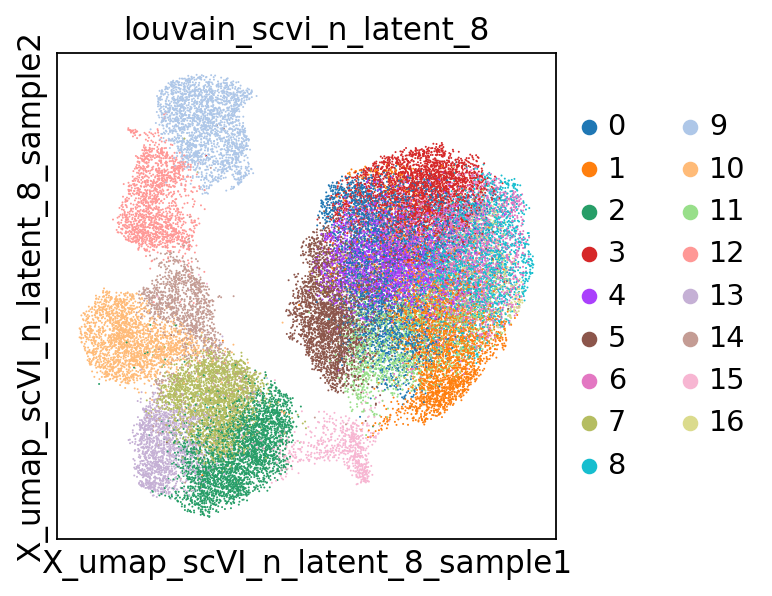

In [122]:
sc.pl.embedding(adata, curr_embedding_key, color='louvain_scvi_n_latent_8')

In [123]:
# where applicable assign annotations of invading troph, rest - annotate by louvain

# final annotation of inv troph
obs_with_final_annot_inv_troph = pd.read_csv(save_path + 'annotations_SN_and_multiome_inv_troph_cleanup_v2_final_20211110.csv',
                                            index_col=0)
adata.obs['final_annot_inv_troph'] = [obs_with_final_annot_inv_troph.loc[barcode,'annot_inv_troph_n_latent_8'] if barcode in obs_with_final_annot_inv_troph.index else 'troph_rest' for barcode in adata.obs_names]


... storing 'final_annot_inv_troph' as categorical


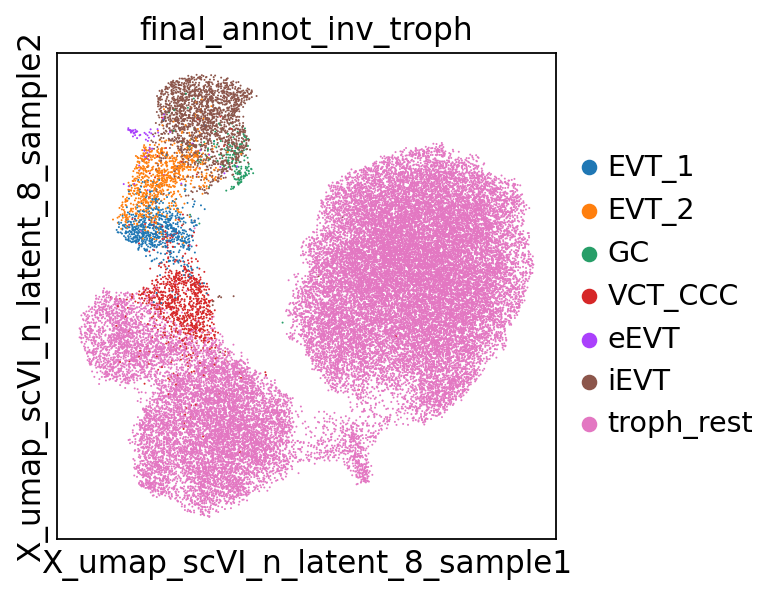

In [124]:
sc.pl.embedding(adata, curr_embedding_key, color='final_annot_inv_troph')

In [ ]:
# cluster the rest of trophoblast here



In [134]:
# cluster apart invading troph from VCT_CCC onwards
sc.tl.louvain(adata, resolution=0.2,
              restrict_to=('final_annot_inv_troph',['troph_rest']),
             neighbors_key = 'neighbors_scVI_n_latent_8_sample',
             key_added = 'louvain_scvi_troph_rest')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 17 clusters and added
    'louvain_scvi_troph_rest', the cluster labels (adata.obs, categorical) (0:00:01)


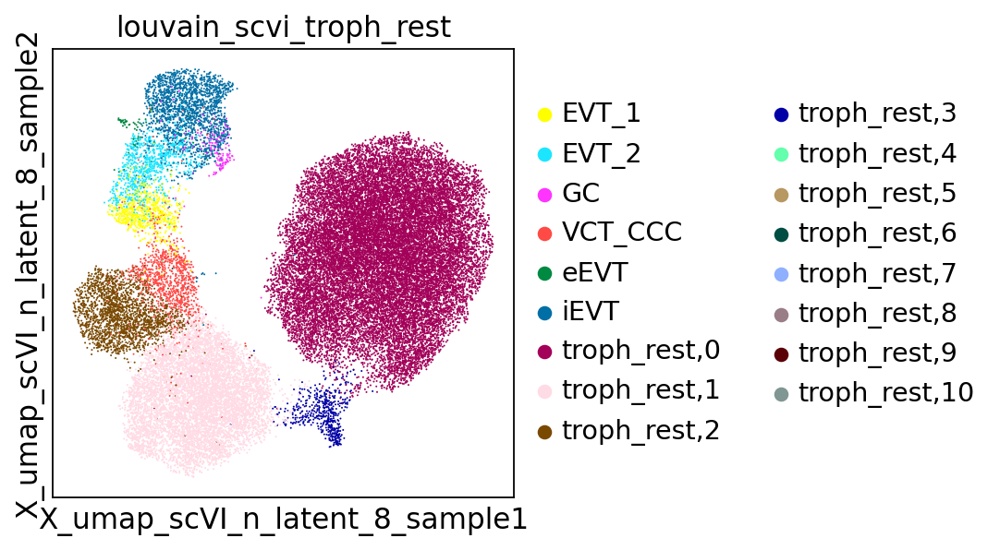

In [135]:
sc.pl.embedding(adata, curr_embedding_key, color='louvain_scvi_troph_rest')

EVT_1


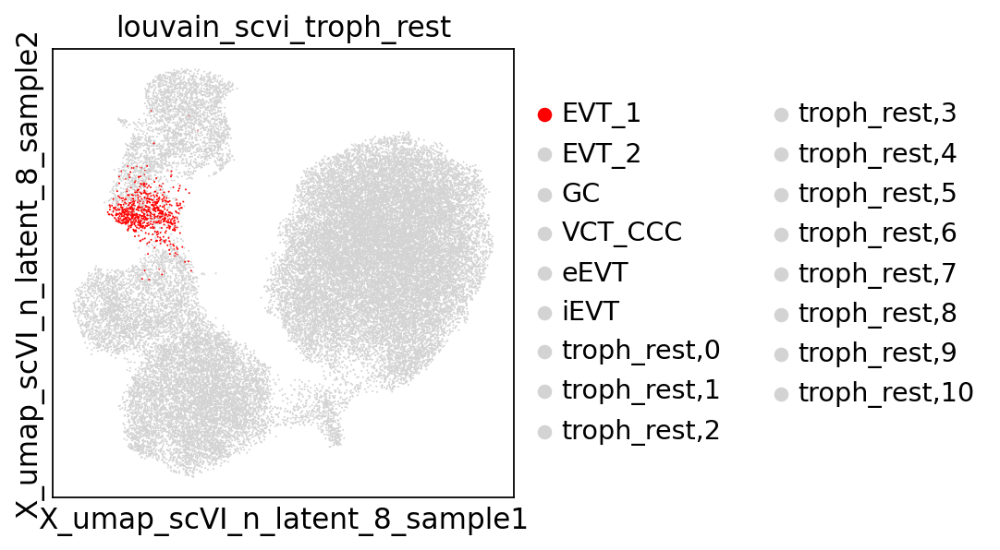

EVT_2


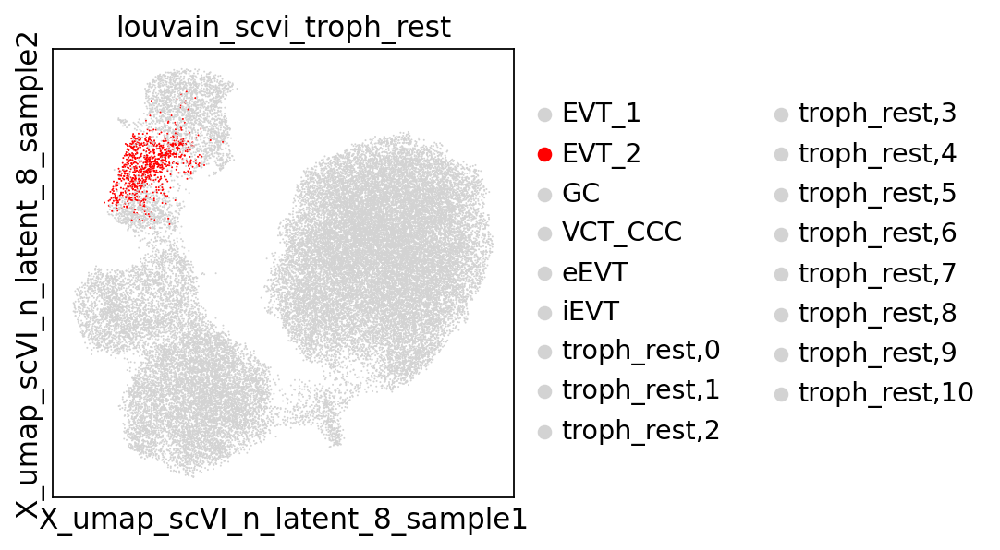

GC


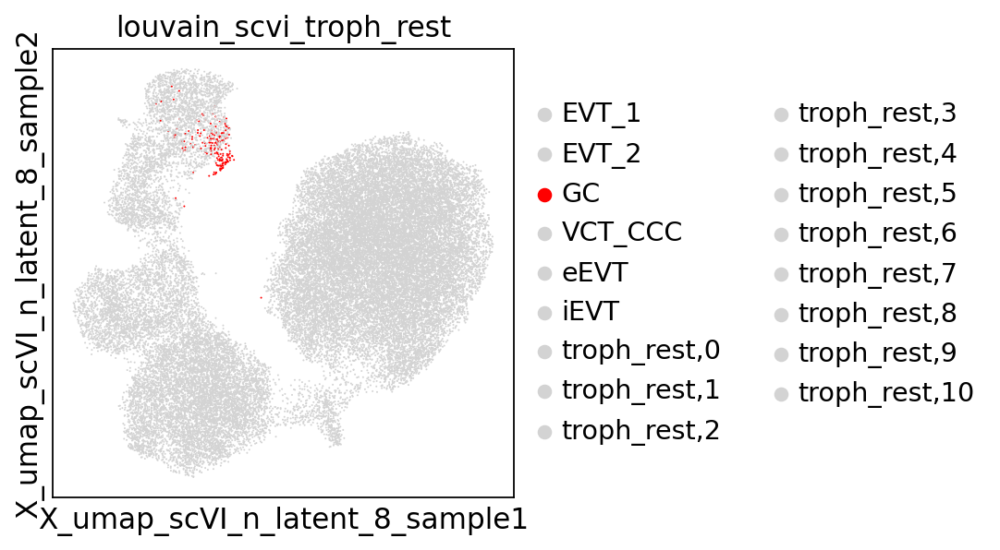

VCT_CCC


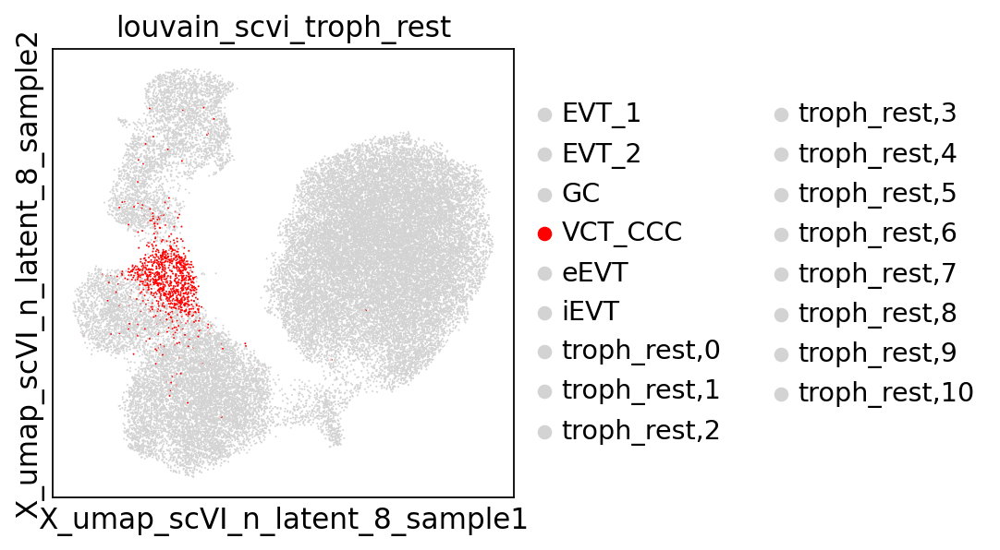

eEVT


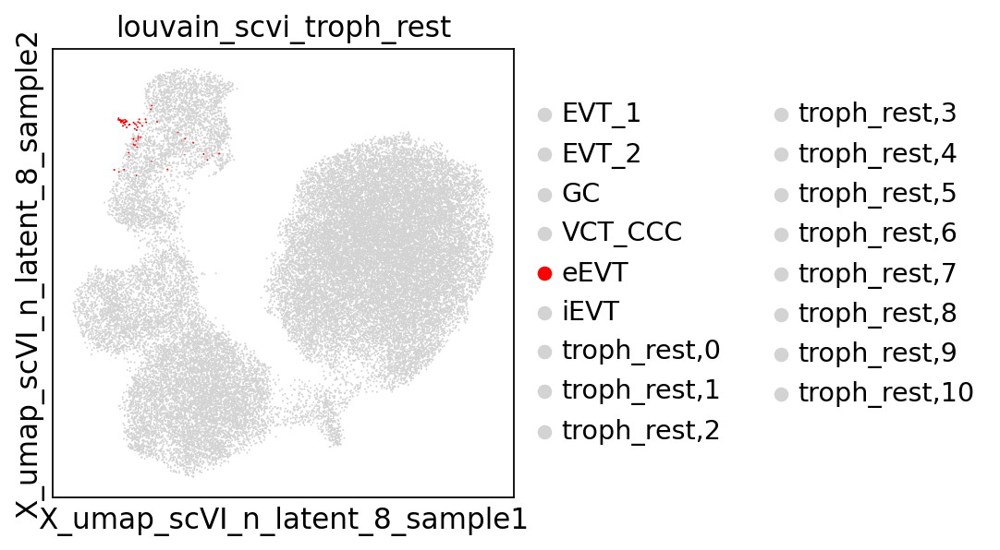

iEVT


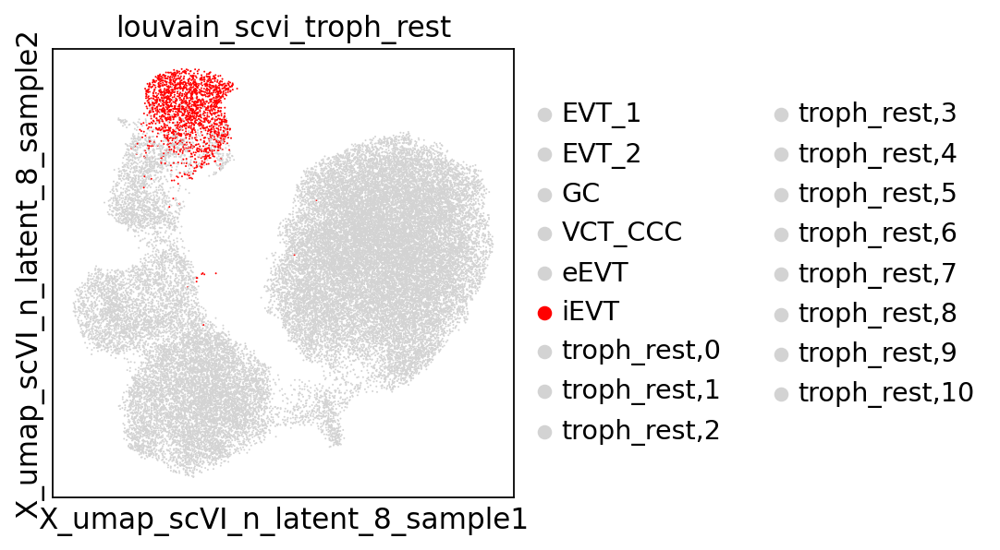

troph_rest,0


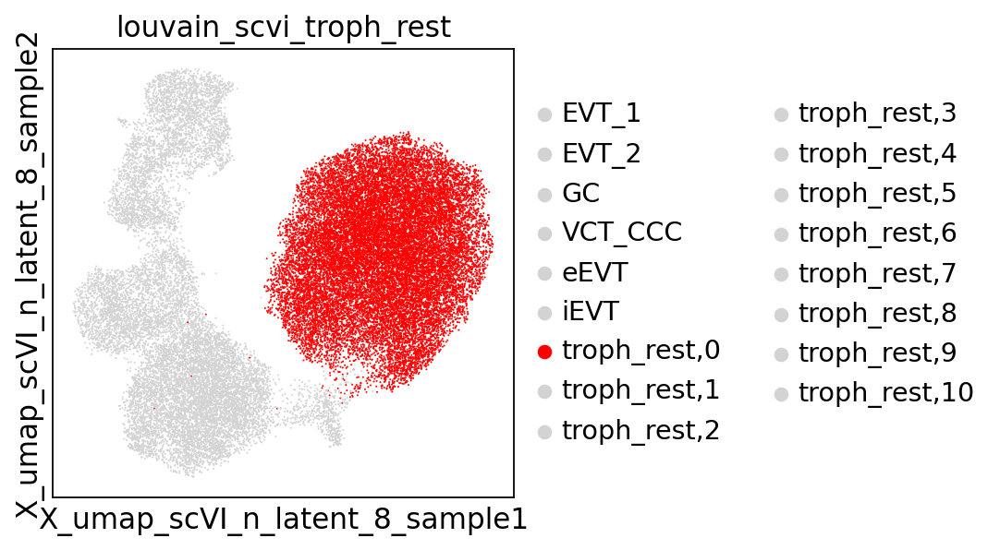

troph_rest,1


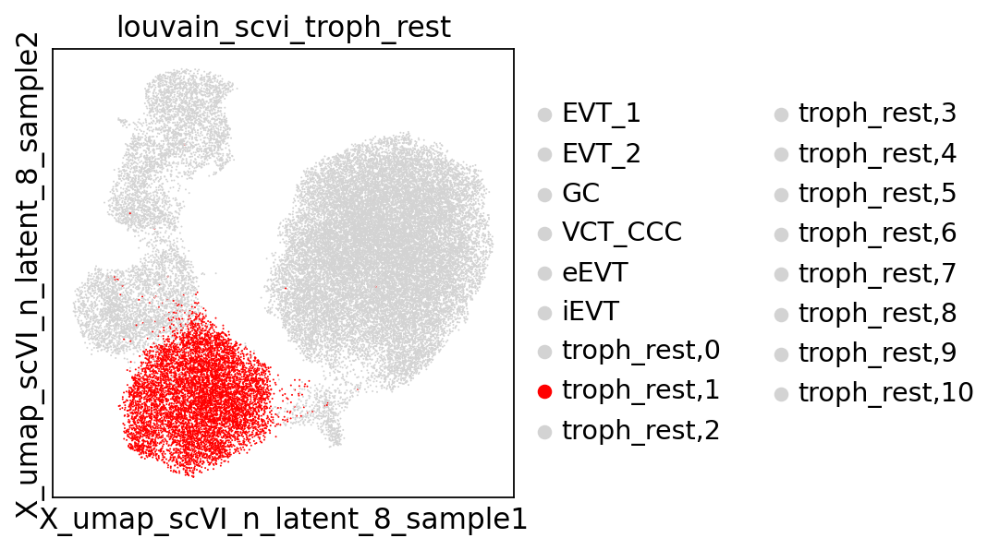

troph_rest,10


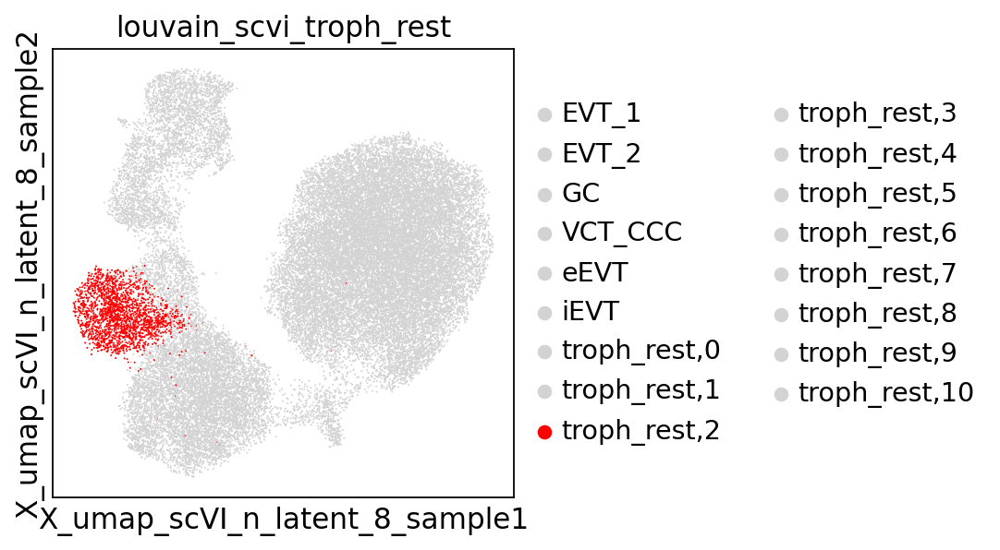

troph_rest,2


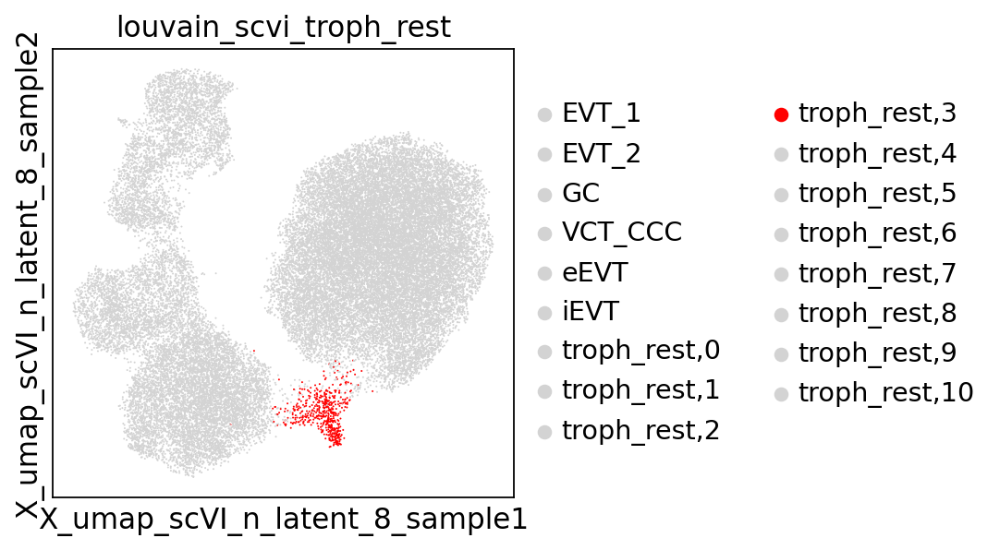

troph_rest,3


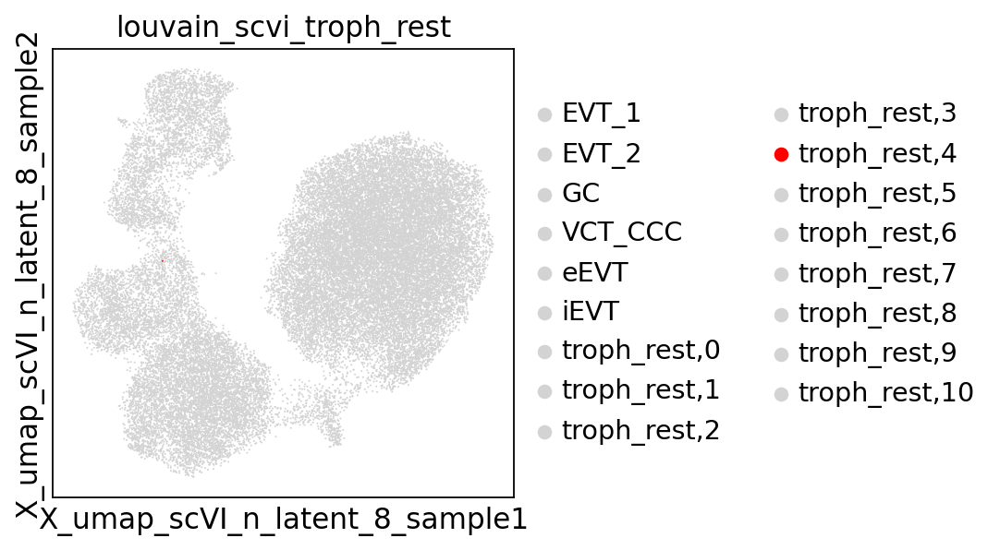

troph_rest,4


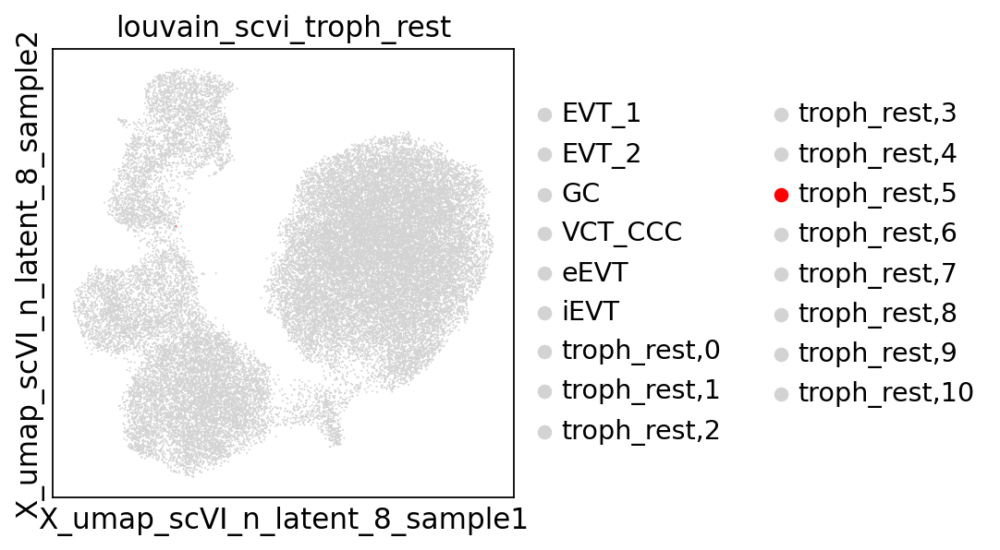

troph_rest,5


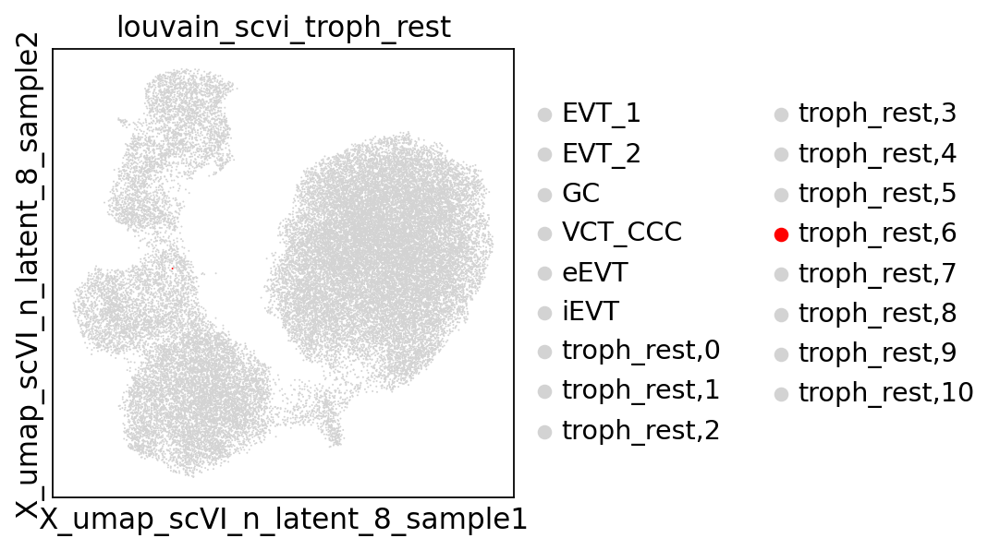

troph_rest,6


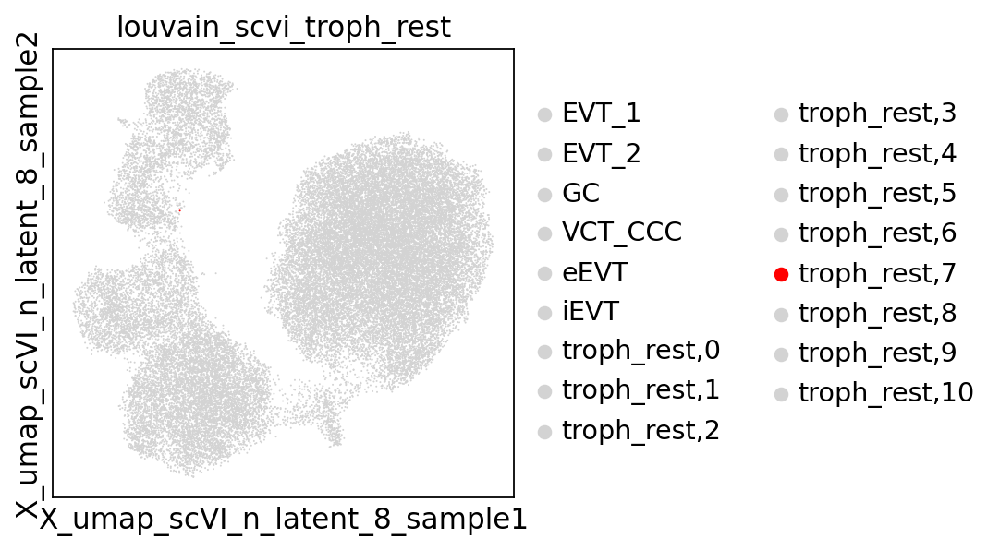

troph_rest,7


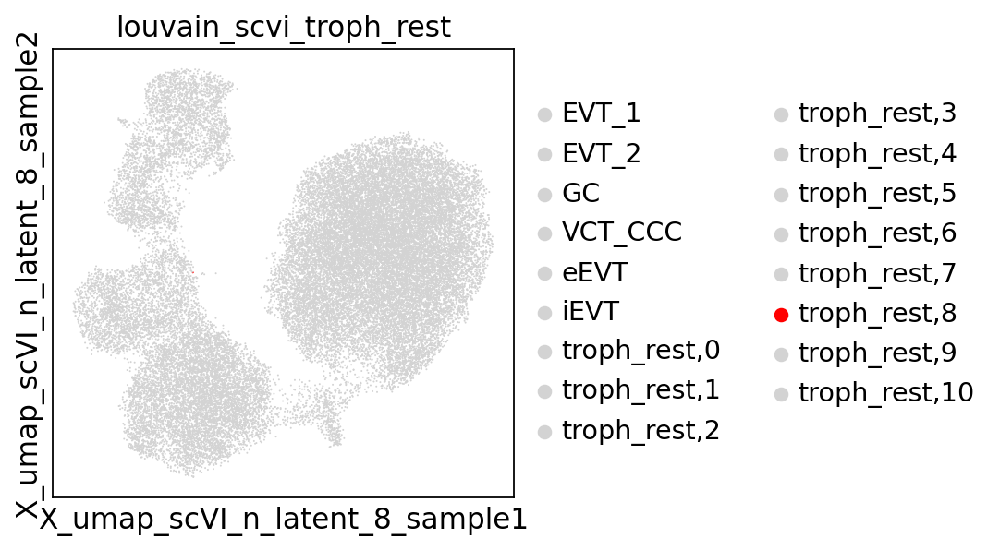

troph_rest,8


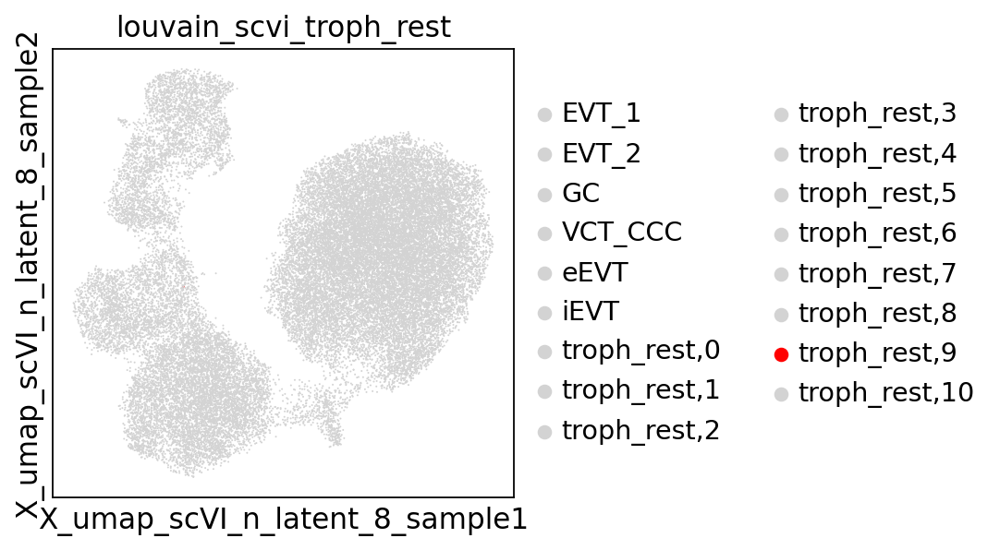

troph_rest,9


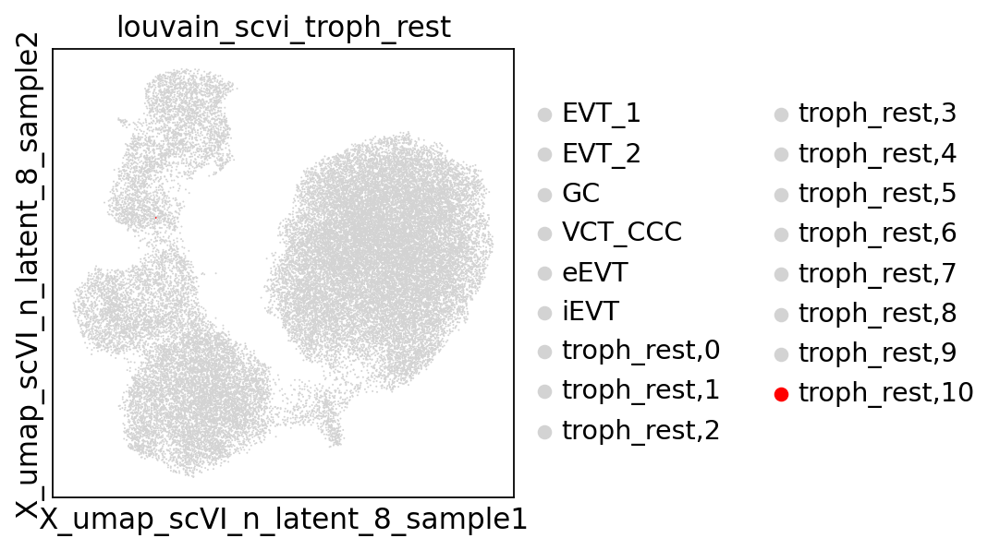

In [137]:
for clus in np.unique(adata.obs['louvain_scvi_troph_rest']):
    print(clus)
    curr_index = list(np.unique(adata.obs['louvain_scvi_troph_rest'])).index(clus)
    sc.pl.embedding(adata, curr_embedding_key, color='louvain_scvi_troph_rest',
                   palette = ['lightgrey']*curr_index + ['red'] + ['lightgrey']*(len(np.unique(adata.obs['louvain_scvi_troph_rest'])) - curr_index))

In [142]:
def annot_final_all_troph(adata_obj, barcode):
    # after troph_rest clusters are located to some inv troph clusters due to ambient RNA
    curr_louvain = adata_obj.obs.loc[barcode,'louvain_scvi_troph_rest']
    
    if curr_louvain == 'troph_rest,0':
        return('SCT')
    elif curr_louvain == 'troph_rest,1':
        return('VCT')
    elif curr_louvain == 'troph_rest,2':
        return('VCT_p')
    elif curr_louvain == 'troph_rest,3':
        return('VCT_fusing')
    elif curr_louvain == 'troph_rest,4':
        return('VCT_CCC')
    elif curr_louvain == 'troph_rest,5':
        return('EVT_1')
    elif curr_louvain == 'troph_rest,6':
        return('VCT_CCC')
    elif curr_louvain == 'troph_rest,7':
        return('EVT_1')
    elif curr_louvain == 'troph_rest,8':
        return('VCT_CCC')
    elif curr_louvain == 'troph_rest,9':
        return('VCT_CCC')
    elif curr_louvain == 'troph_rest,10':
        return('EVT_1')
    
    else:
        return(adata_obj.obs.loc[barcode,'final_annot_inv_troph'])

In [143]:
adata.obs['final_annot_all_troph'] = adata.obs['barcode_sample_copy'].apply(lambda x: annot_final_all_troph(adata,x))

... storing 'final_annot_all_troph' as categorical


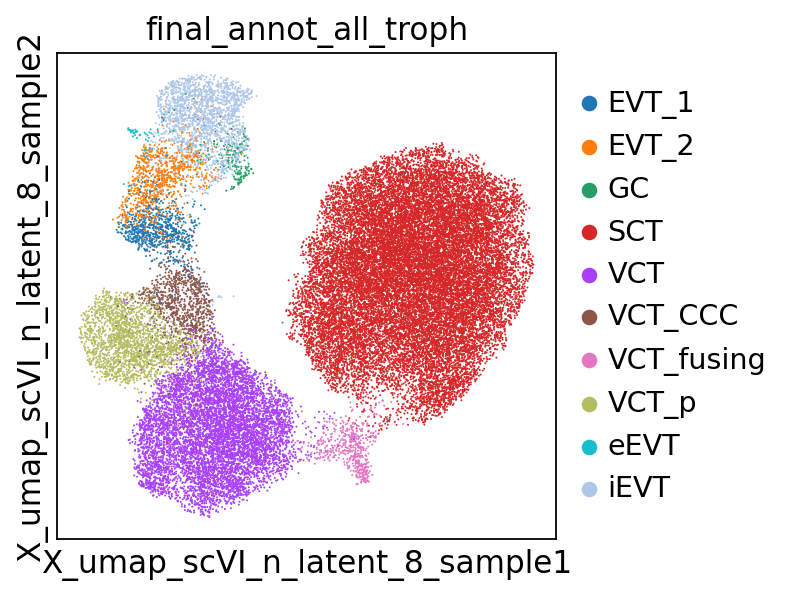

In [144]:
sc.pl.embedding(adata, curr_embedding_key, color='final_annot_all_troph')

In [145]:
# resave object and annotation
adata.write(save_path + 'adata_P13_scVI_analysed_corr_by_sample_SN_and_multiome_trophoblast_v5_final.h5ad')

In [5]:
adata = sc.read(save_path + 'adata_P13_scVI_analysed_corr_by_sample_SN_and_multiome_trophoblast_v5_final.h5ad')

# updating inv troph annotations (23.11.2021)

In [8]:
# updating inv troph annotations (23.11.2021)
# read in final inv troph annotations

# final annotation of inv troph
obs_with_final_annot_inv_troph = pd.read_csv(save_path + 'annotations_SN_and_multiome_inv_troph_cleanup_v2_final_20211123.csv',
                                            index_col=0)
adata.obs['final_annot_all_troph_corrected'] = [obs_with_final_annot_inv_troph.loc[barcode,'annot_inv_troph_n_latent_8_corrected'] if barcode in obs_with_final_annot_inv_troph.index else adata.obs.loc[barcode,'final_annot_all_troph'] for barcode in adata.obs_names]


... storing 'final_annot_inv_troph_corrected' as categorical
... storing 'final_annot_all_troph_corrected' as categorical


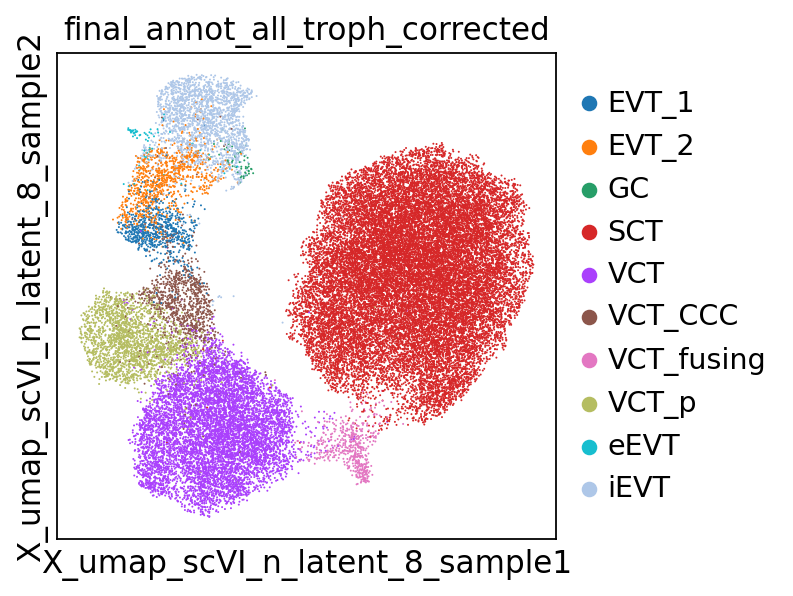

In [11]:
sc.pl.embedding(adata, curr_embedding_key, color='final_annot_all_troph_corrected')

In [12]:
# resave object and annotation
adata.write(save_path + 'adata_P13_scVI_analysed_corr_by_sample_SN_and_multiome_trophoblast_v5_final.h5ad')

# Start from here if you want to plot dotplots with marker gene expression / other metadata for figures etc.

normalised and log tr values are in adata.X

In [10]:
# to make text in figures editeable in Adobe Illustrator
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

In [5]:
adata = sc.read(save_path + 'adata_P13_scVI_analysed_corr_by_sample_SN_and_multiome_trophoblast_v5_final.h5ad')

In [7]:
adata

AnnData object with n_obs × n_vars = 37675 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial', 'louvain_scvi_n_latent_8', 'final_annot_inv_troph', 'louvain_scvi_troph_rest', 'final_annot_all_troph', 'final_annot_inv_troph_corrected', 'final_annot_all_troph_corrected'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', '

In [19]:
adata.obs['technology'] = ['multiome' if sample in ['Pla_Camb10714919_and_40110_Pla_Camb10687915',
       'Pla_Camb10714920_and_40110_Pla_Camb10687916'] else 'snRNA-seq' for sample in adata.obs['sample']]

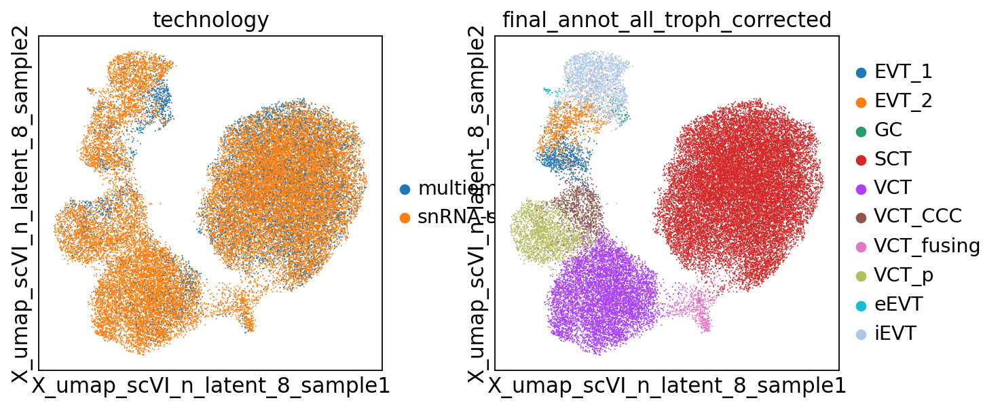

In [16]:
sc.pl.embedding(adata, curr_embedding_key, color=['technology','final_annot_all_troph_corrected'], 
                #legend_loc='on data', legend_fontsize=8,
               )

In [18]:
for ct in np.unique(adata.obs['final_annot_all_troph_corrected']):
    print(ct)
    curr_adata = adata[adata.obs['final_annot_all_troph_corrected'] == ct]
    print(curr_adata.obs['technology'].value_counts())
    print('\n')

EVT_1
snRNA-seq    601
multiome     119
Name: technology, dtype: int64


EVT_2
snRNA-seq    750
multiome     133
Name: technology, dtype: int64


GC
multiome     36
snRNA-seq    22
Name: technology, dtype: int64


SCT
snRNA-seq    18471
multiome      4398
Name: technology, dtype: int64


VCT
snRNA-seq    6944
multiome      616
Name: technology, dtype: int64


VCT_CCC
snRNA-seq    846
multiome     170
Name: technology, dtype: int64


VCT_fusing
snRNA-seq    487
multiome      36
Name: technology, dtype: int64


VCT_p
snRNA-seq    1761
multiome      239
Name: technology, dtype: int64


eEVT
snRNA-seq    62
multiome      9
Name: technology, dtype: int64


iEVT
snRNA-seq    1553
multiome      422
Name: technology, dtype: int64




In [9]:
# getting more distinct colors for the zoomed in plot (donor P13 all troph)

colors_final = ['#EE2724', # EVT_1
                '#F58C74', # EVT_2
                '#726658', # GC
                '#BC80B8', # SCT
                '#81B2D3', # VCT
                '#88CDAF', # VCT_CCC
                '#514C89', # VCT_fusing
                '#3A5337', # VCT_p
                '#21479E', # eEVT
                '#FEEC6E', # iEVT
               ]

In [11]:
adata

AnnData object with n_obs × n_vars = 37675 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial', 'louvain_scvi_n_latent_8', 'final_annot_inv_troph', 'louvain_scvi_troph_rest', 'final_annot_all_troph', 'final_annot_inv_troph_corrected', 'final_annot_all_troph_corrected'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', '

In [12]:
curr_embedding_key = 'X_umap_scVI_n_latent_8_sample'

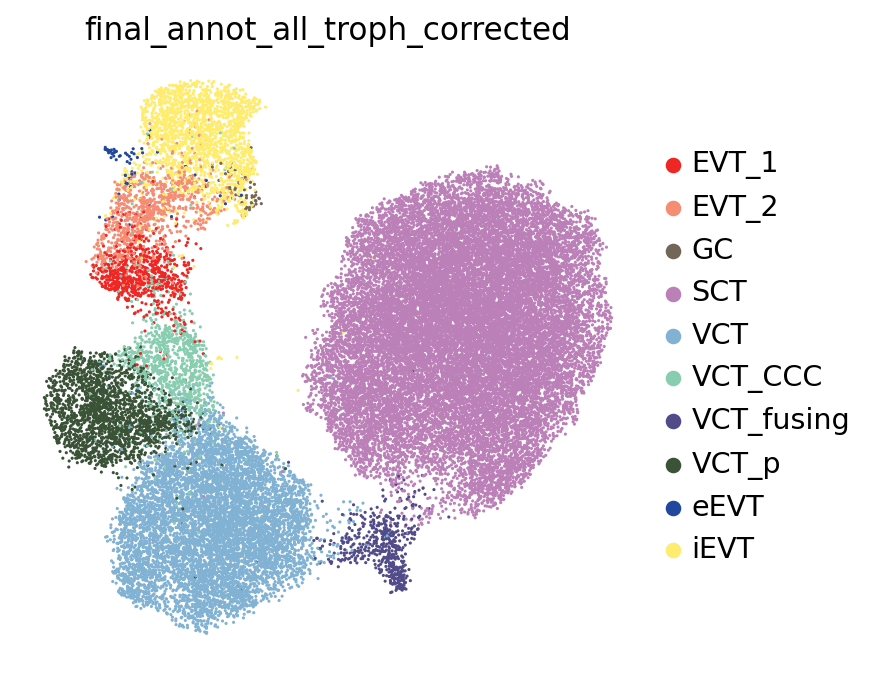

In [13]:
sc.set_figure_params(figsize=(5,5), dpi_save=300)
sc.pl.embedding(adata, curr_embedding_key, color='final_annot_all_troph_corrected', 
                #legend_loc='on data', legend_fontsize=8, 
                size=8,
               palette = colors_final, 
                groups = ['SCT','VCT_fusing','VCT','VCT_p','VCT_CCC','EVT_1','EVT_2','eEVT','iEVT','GC'],
                frameon=False,
                save='_final_P13_all_troph_annot.pdf'
               )

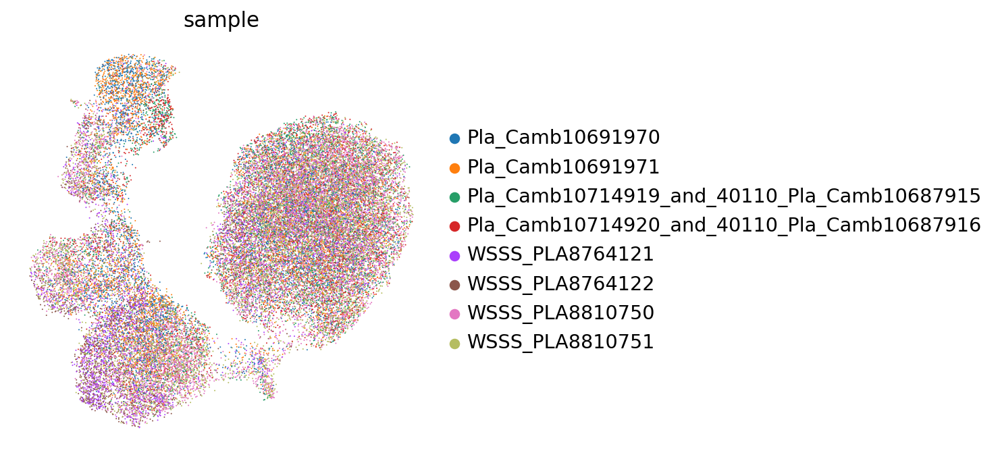

In [24]:
# other important keys to plot for supplementary
sc.set_figure_params(figsize=(5,5), dpi_save=300)
sc.pl.embedding(adata, curr_embedding_key, color=['sample',
                                                  #'technology',
                                                 ], 
                frameon=False,
                #legend_loc='on data', legend_fontsize=8,
                save='_final_P13_sample.pdf'
               )

In [8]:
adata

AnnData object with n_obs × n_vars = 37675 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial', 'louvain_scvi_n_latent_8', 'final_annot_inv_troph', 'louvain_scvi_troph_rest', 'final_annot_all_troph', 'final_annot_inv_troph_corrected', 'final_annot_all_troph_corrected'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', '

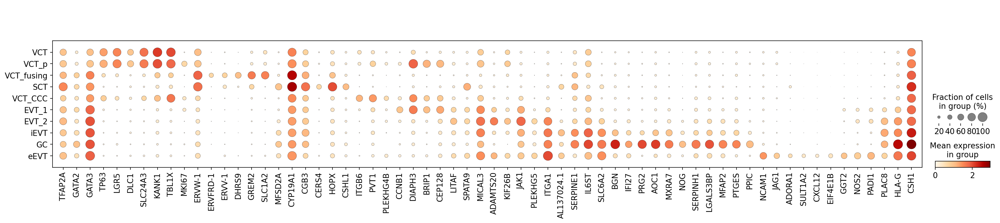

In [24]:
# revisiting which marker genes we want to visualise here
# know markers + TF-IDF ones from running it on this data (P13 donor only)

sc.pl.dotplot(adata, groupby='final_annot_all_troph_corrected', 
              var_names=['TFAP2A','GATA2','GATA3', # general troph markers, literature
                         
                         'TP63','LGR5','DLC1', # VCT markers, TF-IDF
                         'SLC24A3','KANK1','TBL1X','MKI67', # VCT markers from Wilcoxon test and +MKI67 for VST_p (proliferative)
                         
                         'ERVW-1','ERVFRD-1','ERVV-1', # VCT_fusing and SCT, literature
                         'DHRS9','GREM2','SLC1A2', # VCT_fusing, from Wilcoxon test
                         
                         'MFSD2A','CYP19A1','CGB3', # SCT, literature
                         'CERS4','HOPX','CSHL1', # SCT, Wilcoxon test
                         
                         #'NOTCH1','ITGA2', # VCT_CCC, literature but here not much here
                          #'PECAM1','NOTCH4','NOTCH2', 'NOTCH3', 'DLL1', 'DLL4', 'JAG1', 'JAG2', # other VCT_CCC markers from literature - not much here
                         'ITGB6','PVT1','PLEKHG4B', # VCT_CCC, TF-IDF
                         
                         
                         'CCNB1','DIAPH3','BRIP1','CEP128', # EVT_1, Wilcoxon test
                         
                         'LITAF','SPATA9', # EVT_1 and EVT_2, Wilcoxon test
                         
                         'MICAL3','ADAMTS20','KIF26B','JAK1','PLEKHG5','ITGA1', # EVT_2, ITGA1 also for eEVT, Wilcoxon test
                         
                         'AL137024.1','SERPINE1','IL6ST','SLC6A2', # iEVT, Wilcoxon test
                         
                         'BGN','IFI27','PRG2', # GC, Wilcoxon test
                         'AOC1','MXRA7','NOG','SERPINH1','LGALS3BP','MFAP2','PTGES','PPIC', # GC, TF-IDF
                         
                         'NCAM1','JAG1','ADORA1','SULT1A2','CXCL12', # eEVT, NCAM1 from literature (with HLA-G) and rest from Wilcoxon test
                         'EIF4E1B','GGT2','NOS2','PADI1', # eEVT, TF-IDF
                         
                         'PLAC8', # starts to be upreg in invading trophoblast, literature
                         
                         'HLA-G','CSH1', # all troph deep in the decidua (invasive), literature

                        ],
              
              cmap='OrRd',
             categories_order=['VCT','VCT_p','VCT_fusing','SCT','VCT_CCC','EVT_1','EVT_2','iEVT','GC','eEVT'],
              save='_final_P13_dorplot_markers_troph_20220216.pdf'
             )

## Preparing the object for cellxgene

In [6]:
# saving object for cellxgene
# in this object in .X are the normalised and log tr counts for all filtered cells and genes
adata

AnnData object with n_obs × n_vars = 37675 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial', 'louvain_scvi_n_latent_8', 'final_annot_inv_troph', 'louvain_scvi_troph_rest', 'final_annot_all_troph', 'final_annot_inv_troph_corrected', 'final_annot_all_troph_corrected'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', '

In [7]:
save_path

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202007_snRNA-seq_MFI/snRNA_seq_MFI_202007_adatas/202012_FINAL_reanalysis_with_souporcell_deconvolution_common_variants/donor_P13_all_samples_analysis_202110/'

In [8]:
import scipy
adata.X = scipy.sparse.csc_matrix(adata.X)


In [9]:
adata.obs.columns

Index(['n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito',
       'n_counts', 'dataset', 'technique', 'scrublet_score',
       'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet',
       'barcode_sample_copy', 'barcode', 'souporcell_assignment',
       'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev',
       'louvain', 'is_doublet_propagate', 'origin_M_F',
       'annotation_prev_or_removed', 'inv_troph_labels_initial',
       'louvain_scvi_n_latent_8', 'final_annot_inv_troph',
       'louvain_scvi_troph_rest', 'final_annot_all_troph',
       'final_annot_inv_troph_corrected', 'final_annot_all_troph_corrected'],
      dtype='object')

In [10]:
categ_columns = ['donor', 'tissue_block', 'age', 'sample', 
                 'dataset', 'technique', 'batch', 'is_doublet',
       'barcode', 'souporcell_assignment',
       'inter_ind_doublet', 'phase', 'annotation_prev',
       'louvain', 'is_doublet_propagate', 'origin_M_F',
       'annotation_prev_or_removed', 'inv_troph_labels_initial',
       'louvain_scvi_n_latent_8', 'final_annot_inv_troph',
       'louvain_scvi_troph_rest', 'final_annot_all_troph',
       'final_annot_inv_troph_corrected', 'final_annot_all_troph_corrected']


cont_columns = ['n_genes', 'percent_mito',
       'n_counts', 'scrublet_score',
       'scrublet_cluster_score', 'bh_pval', 'S_score', 'G2M_score',]


In [11]:
for column in categ_columns:
    adata.obs[column] = pd.Categorical(adata.obs[column])
    
for column in cont_columns:
    adata.obs[column] = np.float32(adata.obs[column])

In [12]:
adata

AnnData object with n_obs × n_vars = 37675 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'inv_troph_labels_initial', 'louvain_scvi_n_latent_8', 'final_annot_inv_troph', 'louvain_scvi_troph_rest', 'final_annot_all_troph', 'final_annot_inv_troph_corrected', 'final_annot_all_troph_corrected'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', '

In [13]:
# in X_umap saving the correct final representation
adata.obsm['X_umap'] = adata.obsm['X_umap_scVI_n_latent_8_sample']

In [14]:
# removing a bunch of unnecessary metadata from .obs
adata.obs.columns

Index(['n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito',
       'n_counts', 'dataset', 'technique', 'scrublet_score',
       'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet',
       'barcode_sample_copy', 'barcode', 'souporcell_assignment',
       'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev',
       'louvain', 'is_doublet_propagate', 'origin_M_F',
       'annotation_prev_or_removed', 'inv_troph_labels_initial',
       'louvain_scvi_n_latent_8', 'final_annot_inv_troph',
       'louvain_scvi_troph_rest', 'final_annot_all_troph',
       'final_annot_inv_troph_corrected', 'final_annot_all_troph_corrected'],
      dtype='object')

In [15]:
cols2keep = ['n_genes', 'donor', 'tissue_block', 'age', 'sample',
       'n_counts', 'dataset', 'technique', 'batch',
        'barcode','S_score', 'G2M_score', 'phase', 'origin_M_F',
       'annotation_prev_or_removed', 'final_annot_all_troph_corrected']
adata.obs = adata.obs.loc[:, cols2keep]

In [16]:
# to save for cellxgene/reproductivecellatlas
#adata.write(save_path + 'adata_all_troph_donor_P13_20220218_for_cellxgene.h5ad')
adata.write('/lustre/scratch117/cellgen/team292/aa22/sharing/202202_for_MFI_handover/objects_for_cellxgene_and_reproductivecellatlas/adata_P13_trophoblast_normlog_counts_in_X_for_visualisation.h5ad')


In [17]:
# additionally, putting actual raw counts in .raw.X
adata_raw = sc.read(save_path + 'adata_raw_filtered.h5ad')
adata_raw = adata_raw[adata.obs_names,:]

# raw values
adata.raw = adata_raw.copy()

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [18]:
# additionally saving the same object for downloading after adding raw counts into the .raw.X layer
adata.write('/lustre/scratch117/cellgen/team292/aa22/sharing/202202_for_MFI_handover/objects_for_cellxgene_and_reproductivecellatlas/adata_P13_trophoblast_raw_counts_in_raw_normlog_counts_in_X_for_download.h5ad')
